In [17]:
import os
import numpy as np
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model


In [18]:
def preprocess_image(image_path):
    image = Image.open(image_path)
    gray_image = image.convert("L")

    enhancer = ImageEnhance.Sharpness(gray_image)
    sharp_image = enhancer.enhance(2.0)

    resized_image = sharp_image.resize((256, 256), Image.LANCZOS)
    final_image = ImageEnhance.Sharpness(resized_image).enhance(1.5)

    final_image_rgb = np.stack([np.array(final_image)] * 3, axis=-1)
    return final_image_rgb


In [19]:
def predict_binary(model, image_path):
    image_array = preprocess_image(image_path) / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    prediction = model.predict(image_array)
    predicted_class = 1 if prediction >= 0.5 else 0
    probability = prediction[0][0]
    return predicted_class, probability

In [20]:
def predict_insurance_company(model, image_path, class_names):
    image_array = preprocess_image(image_path) / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    prediction = model.predict(image_array)
    predicted_index = np.argmax(prediction[0])
    predicted_class = class_names[predicted_index]
    probability = prediction[0][predicted_index]
    return predicted_class, probability

In [21]:
def classify_images(binary_model, multi_model, folder_path):
    binary_class_names = {0: "Medical Care Form", 1: "Prescription"}
    insurance_class_names = ['BH', 'CNAM', 'STAR']

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp')):
            image_path = os.path.join(folder_path, filename)

            binary_class, binary_prob = predict_binary(binary_model, image_path)
            binary_class_name = binary_class_names[binary_class]

            print(f"\nImage: {filename}")
            print(f"Step 1 - Binary Classification: {binary_class_name} ({binary_prob:.2%})")

            image = Image.open(image_path)
            plt.imshow(image)
            plt.axis('off')

            if binary_class == 0:  
                insurance_class, insurance_prob = predict_insurance_company(multi_model, image_path, insurance_class_names)
                plt.title(f"{binary_class_name} → {insurance_class} ({insurance_prob:.2%})")
                print(f"Step 2 - Insurance Classification: {insurance_class} ({insurance_prob:.2%})")
            else:
                plt.title(f"{binary_class_name}")

            plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 589ms/step
Image: 04ddad9c-049b-4ff2-931d-660a1cecf220.jpeg, Predicted Class: CNAM, Probability: 0.9998


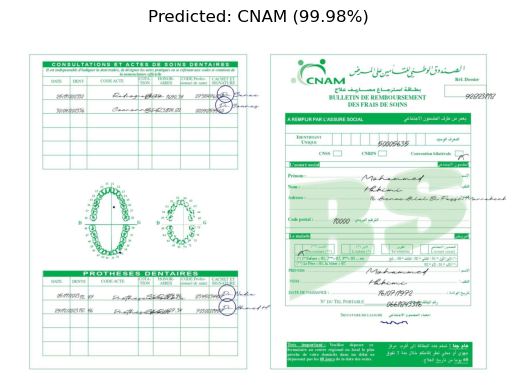

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
Image: 0f0f186a-3ec2-423f-84ce-5c09aada2310.jpeg, Predicted Class: CNAM, Probability: 0.9999


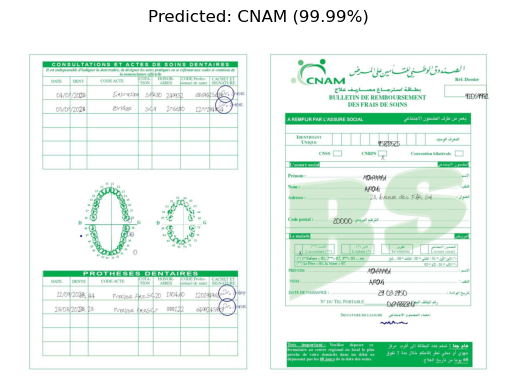

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
Image: 125ecfab-152d-4273-999d-4a8c4e77ec98.jpeg, Predicted Class: CNAM, Probability: 0.9999


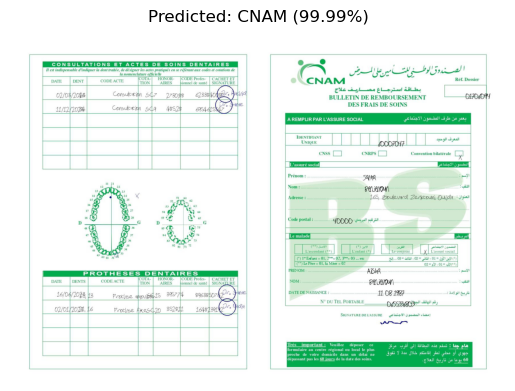

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
Image: 1486--9550657--20230720_page_0.jpg, Predicted Class: STAR, Probability: 0.9999


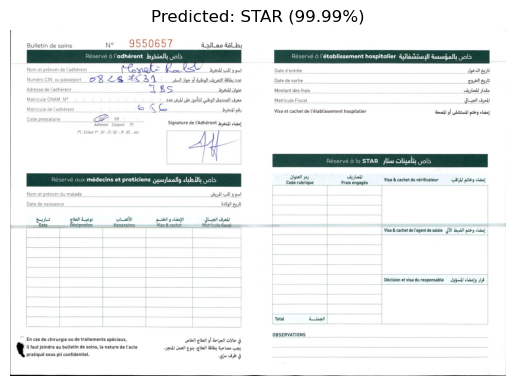

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
Image: 1487--9550656--20230720_page_0.jpg, Predicted Class: STAR, Probability: 0.9999


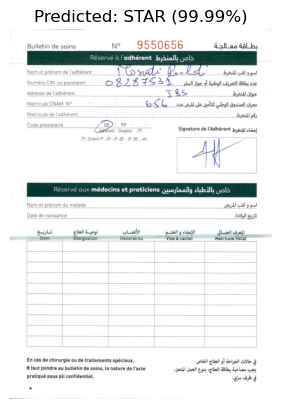

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
Image: 1495--9550929--20230720_page_0.jpg, Predicted Class: STAR, Probability: 0.9997


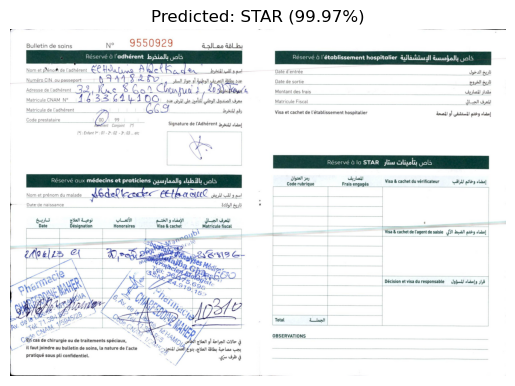

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
Image: 1497--9550814--20230720_page_0.jpg, Predicted Class: STAR, Probability: 0.9999


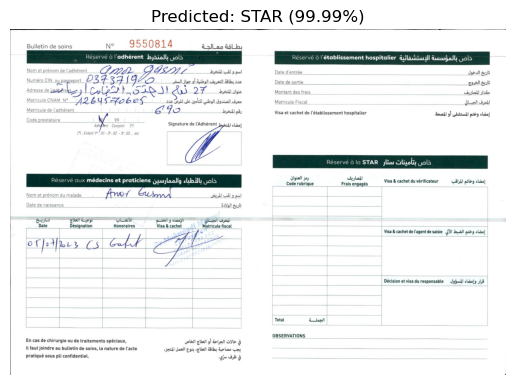

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
Image: 2f2224eb-e6bf-406a-ba40-1cb9743375d5.jpeg, Predicted Class: CNAM, Probability: 0.9999


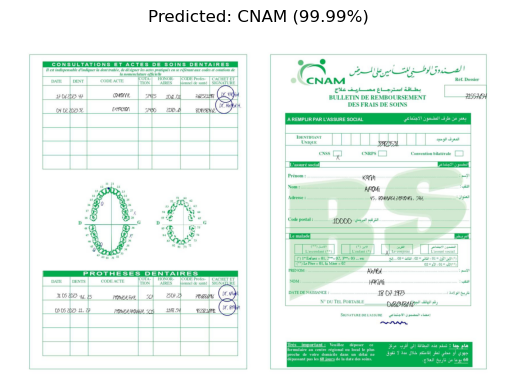

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
Image: 4bf9c6ec-e088-4ea3-ad32-2febd88ad2f3.jpeg, Predicted Class: CNAM, Probability: 0.9999


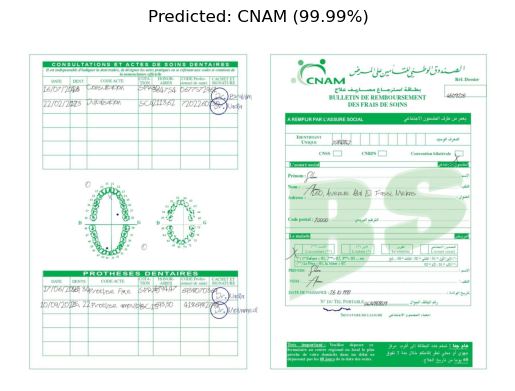

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
Image: 6e0e8d74-adbe-41b0-8961-cca545526325.jpeg, Predicted Class: CNAM, Probability: 0.9999


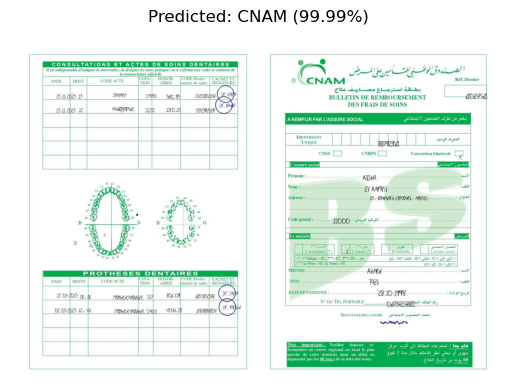

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
Image: 92999e1e-724d-4d5d-9e57-d26b4d1f05d7.jpeg, Predicted Class: CNAM, Probability: 1.0000


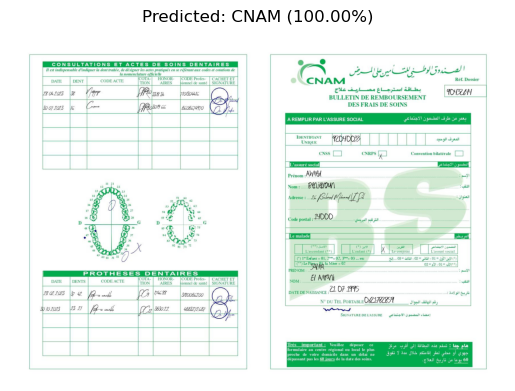

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
Image: b099953e-1beb-4357-864b-84cfefd080a1.jpeg, Predicted Class: CNAM, Probability: 0.9999


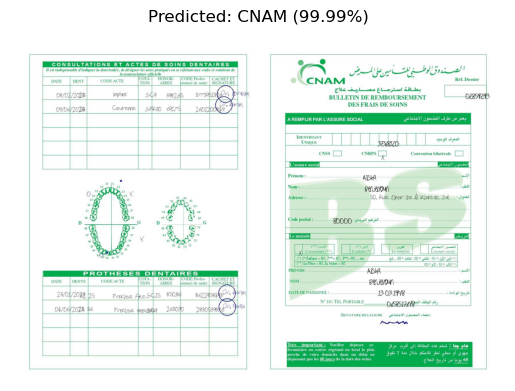

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
Image: ee73ce24-e707-4c60-ab91-34ba8cbce25a.jpeg, Predicted Class: CNAM, Probability: 0.9999


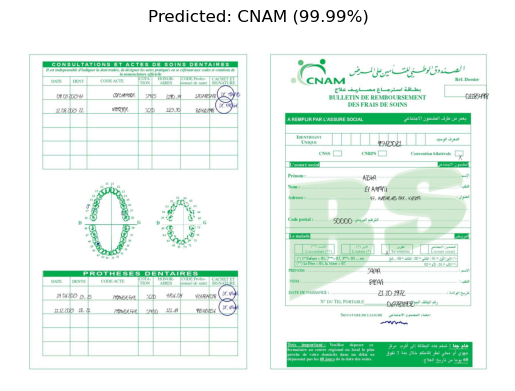

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
Image: output_page_one_877.jpg, Predicted Class: BH, Probability: 0.9996


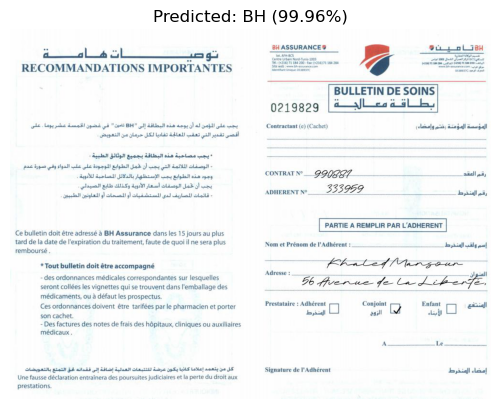

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
Image: output_page_one_878.jpg, Predicted Class: BH, Probability: 0.9997


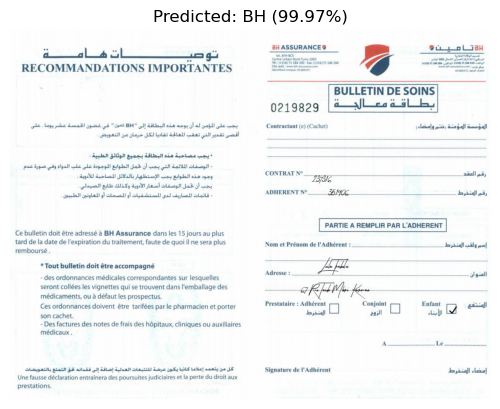

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Image: output_page_one_879.jpg, Predicted Class: BH, Probability: 0.9996


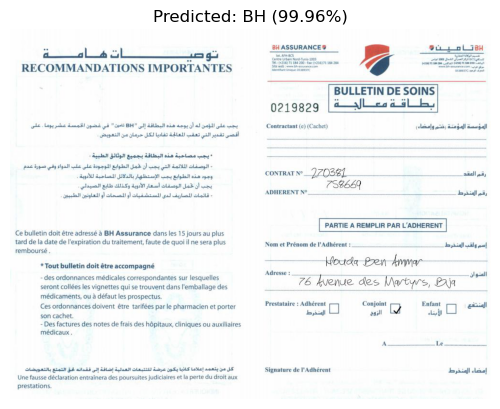

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
Image: output_page_one_880.jpg, Predicted Class: BH, Probability: 0.9974


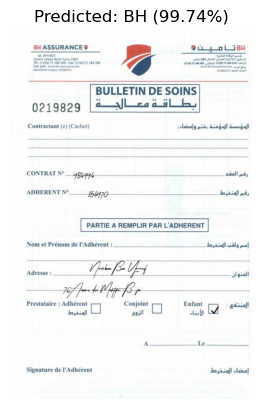

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
Image: output_page_one_889.jpg, Predicted Class: BH, Probability: 0.9997


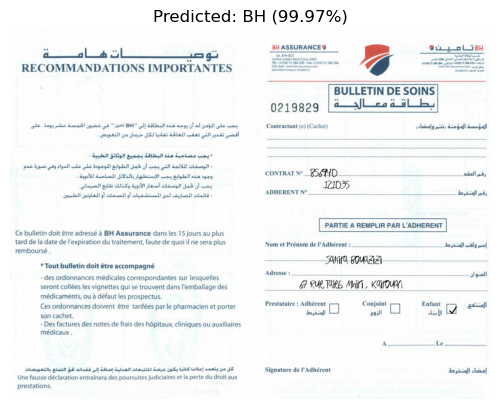

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
Image: output_page_one_890.jpg, Predicted Class: BH, Probability: 0.9997


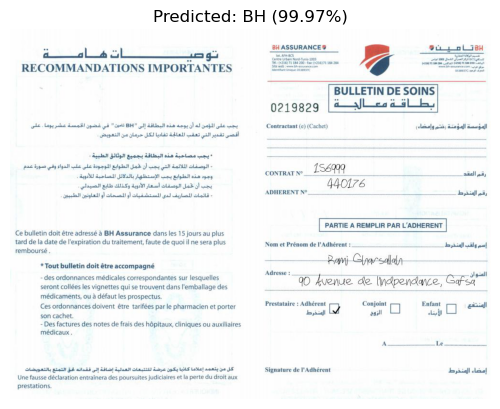

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
Image: output_page_one_891.jpg, Predicted Class: BH, Probability: 0.9996


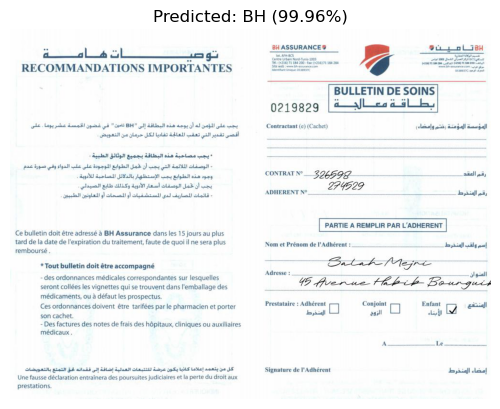

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
Image: output_page_one_892.jpg, Predicted Class: BH, Probability: 0.9996


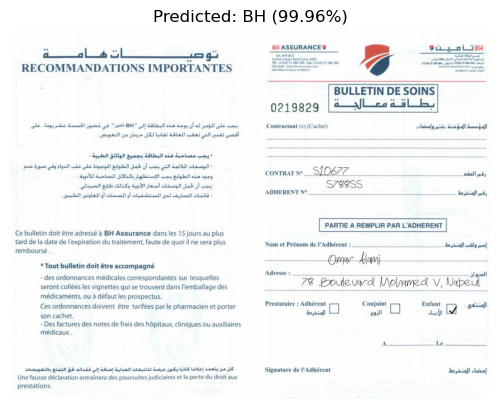

In [5]:
model = load_model("insurance_classifier_vgg16.h5")

class_names = ['BH', 'CNAM', 'STAR']  

test_folder = "output/"

predict_images_in_folder(model, test_folder, class_names)


# Predict classification combined (if medical care form we predict the insurance company name)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step

Image: 04ddad9c-049b-4ff2-931d-660a1cecf220.jpeg
Step 1 - Binary Classification: Medical Care Form (0.01%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step
Step 2 - Insurance Classification: CNAM (99.98%)


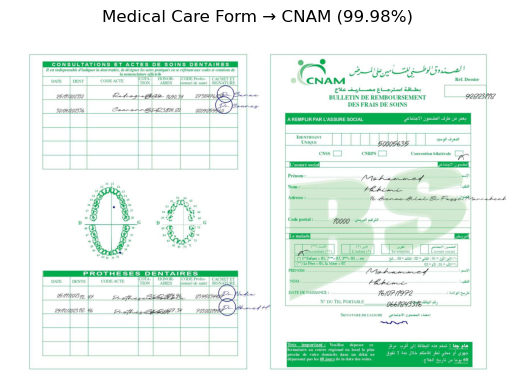

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

Image: 125ecfab-152d-4273-999d-4a8c4e77ec98.jpeg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
Step 2 - Insurance Classification: CNAM (99.99%)


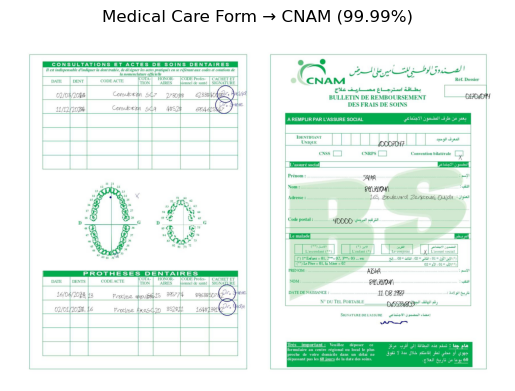

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: 2f2224eb-e6bf-406a-ba40-1cb9743375d5.jpeg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
Step 2 - Insurance Classification: CNAM (99.99%)


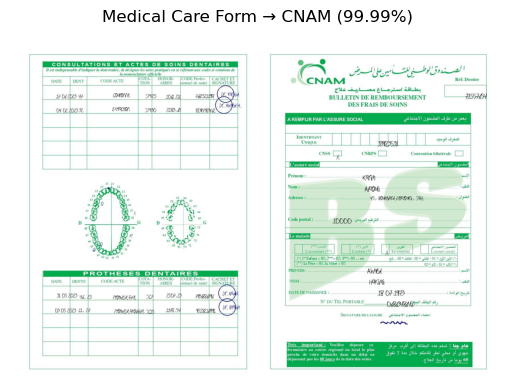

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Image: 3e1ec6dc-2a85-4a71-90f9-69339c7a1815.jpeg
Step 1 - Binary Classification: Medical Care Form (0.01%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
Step 2 - Insurance Classification: CNAM (99.99%)


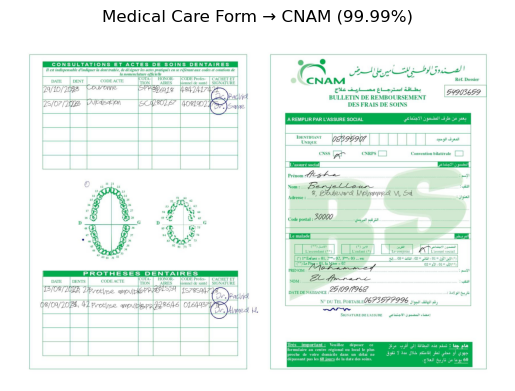

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: 6e0e8d74-adbe-41b0-8961-cca545526325.jpeg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
Step 2 - Insurance Classification: CNAM (99.99%)


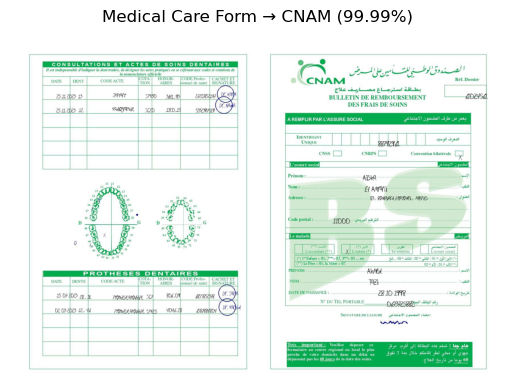

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: 9920--8664626--20231031_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
Step 2 - Insurance Classification: STAR (99.96%)


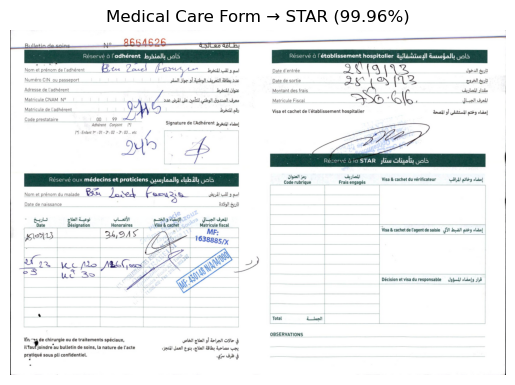

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: 9925--8664154--20231031_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
Step 2 - Insurance Classification: STAR (99.97%)


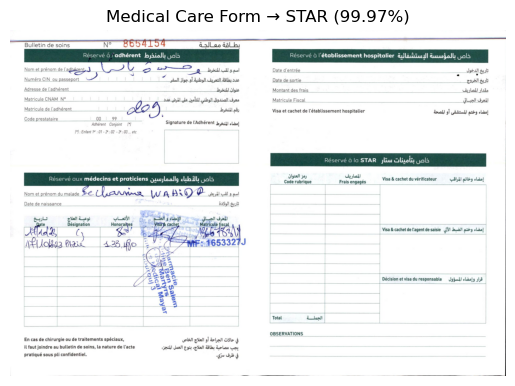

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step

Image: 9926--8664249--20231031_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.17%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step
Step 2 - Insurance Classification: STAR (99.96%)


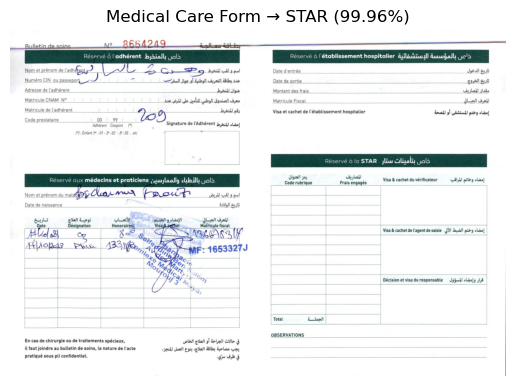

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

Image: 9932--9546915--20231013_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
Step 2 - Insurance Classification: STAR (99.99%)


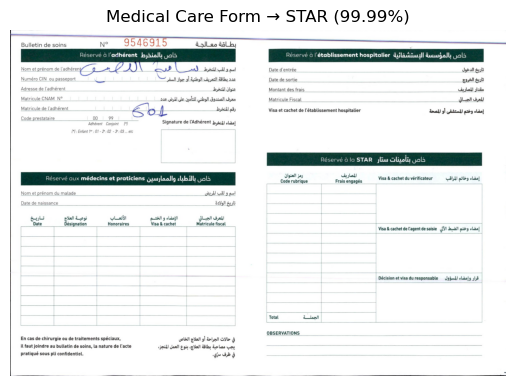

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step

Image: 9933--9546533--20231013_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
Step 2 - Insurance Classification: STAR (99.98%)


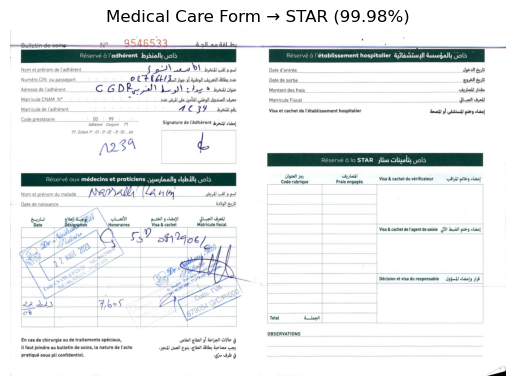

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Image: 9950--6266370--20231031_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.03%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
Step 2 - Insurance Classification: STAR (99.99%)


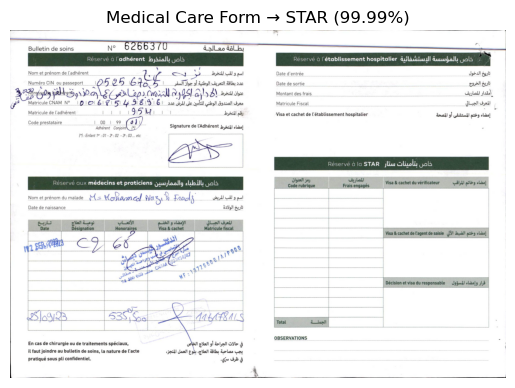

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step

Image: 9953--9184824--20231031_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
Step 2 - Insurance Classification: STAR (99.94%)


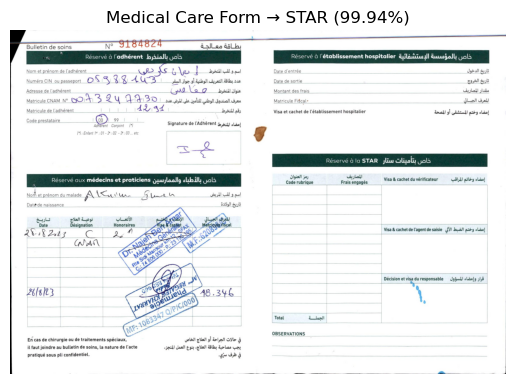

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Image: 9954--9127742--20231031_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
Step 2 - Insurance Classification: STAR (99.98%)


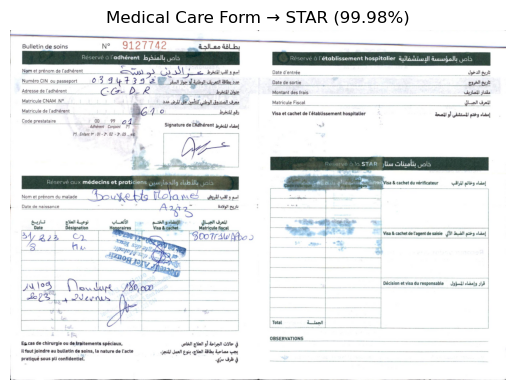

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

Image: 9959--7140009--20231013_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
Step 2 - Insurance Classification: STAR (99.98%)


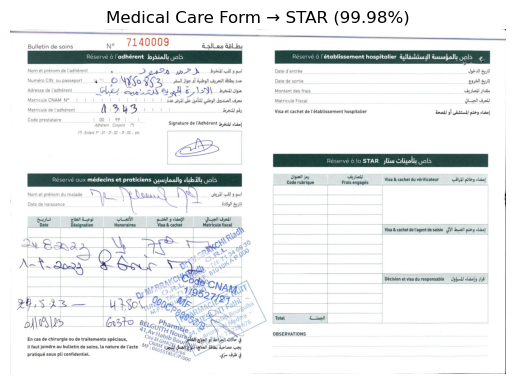

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

Image: b099953e-1beb-4357-864b-84cfefd080a1.jpeg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
Step 2 - Insurance Classification: CNAM (99.99%)


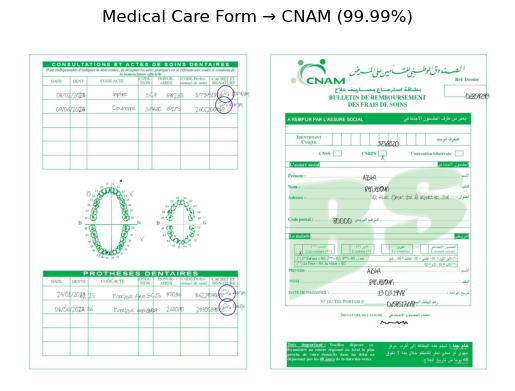

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

Image: Capture d’écran 2025-02-23 163732.png
Step 1 - Binary Classification: Medical Care Form (0.25%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
Step 2 - Insurance Classification: STAR (100.00%)


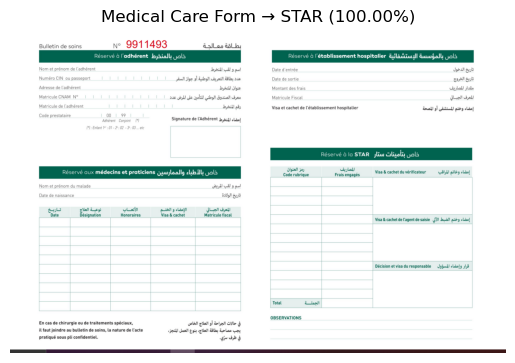

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

Image: Capture d’écran 2025-02-23 163823.png
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
Step 2 - Insurance Classification: STAR (99.97%)


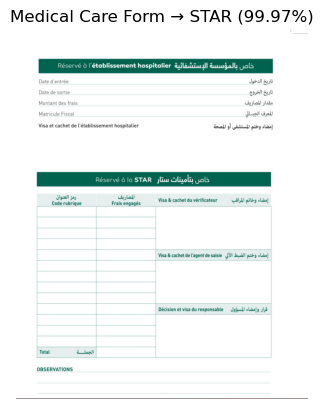

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step

Image: Capture d’écran 2025-02-23 163833.png
Step 1 - Binary Classification: Medical Care Form (11.66%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
Step 2 - Insurance Classification: STAR (99.99%)


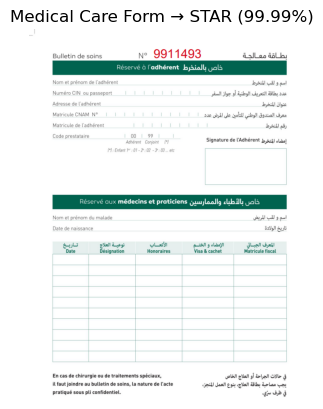

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step

Image: ee73ce24-e707-4c60-ab91-34ba8cbce25a.jpeg
Step 1 - Binary Classification: Medical Care Form (0.02%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
Step 2 - Insurance Classification: CNAM (99.99%)


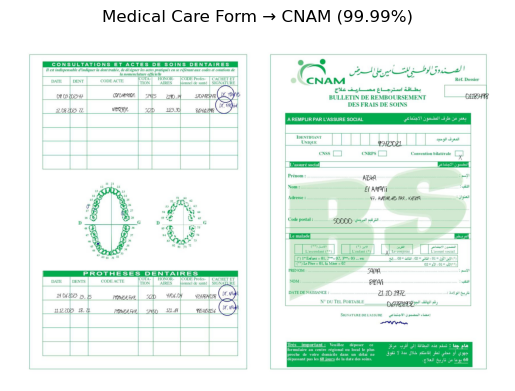

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

Image: left_0761--9245676--20230705_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
Step 2 - Insurance Classification: STAR (99.83%)


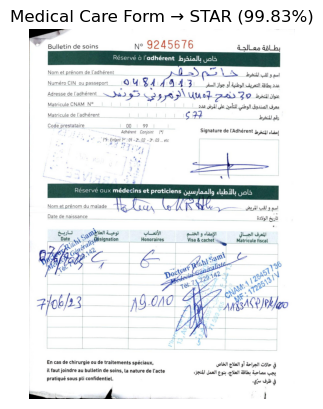

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

Image: left_0762--9550731--20230705_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step
Step 2 - Insurance Classification: STAR (99.97%)


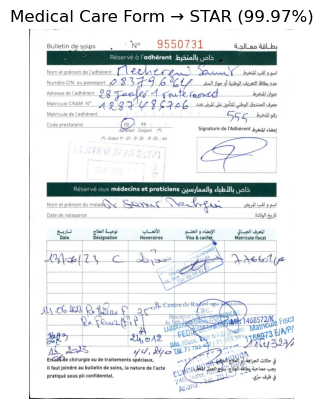

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: left_0764--9550816--20230705_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step
Step 2 - Insurance Classification: STAR (99.99%)


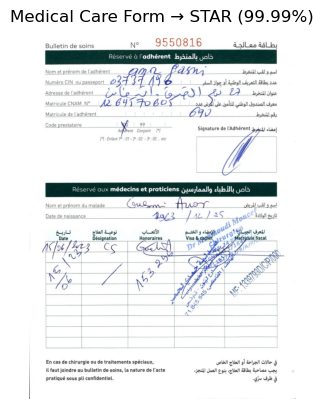

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Image: left_0765--8753652--20230705_page_0.jpg
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
Step 2 - Insurance Classification: STAR (99.97%)


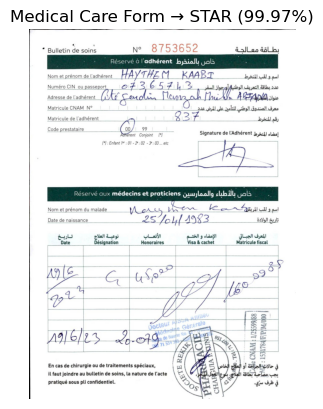

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step

Image: output_page_one_229.jpg
Step 1 - Binary Classification: Medical Care Form (1.22%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step
Step 2 - Insurance Classification: BH (99.97%)


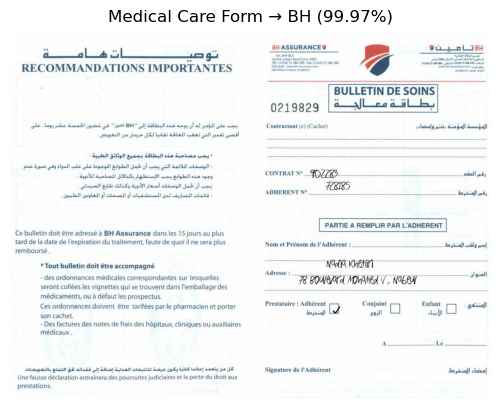

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: output_page_one_230.jpg
Step 1 - Binary Classification: Medical Care Form (1.38%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
Step 2 - Insurance Classification: BH (99.97%)


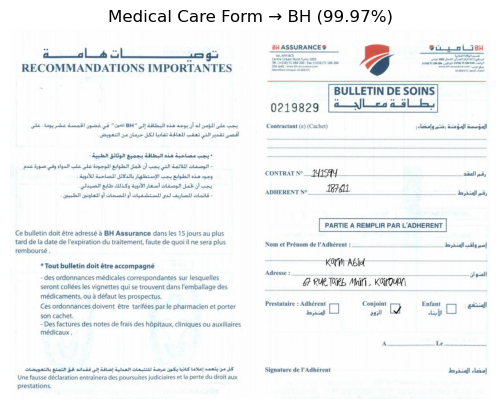

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

Image: output_page_one_231.jpg
Step 1 - Binary Classification: Medical Care Form (0.69%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
Step 2 - Insurance Classification: BH (99.94%)


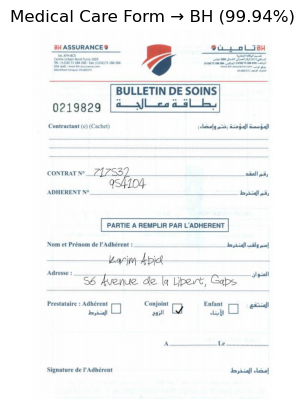

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Image: output_page_one_232.jpg
Step 1 - Binary Classification: Medical Care Form (1.33%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
Step 2 - Insurance Classification: BH (99.97%)


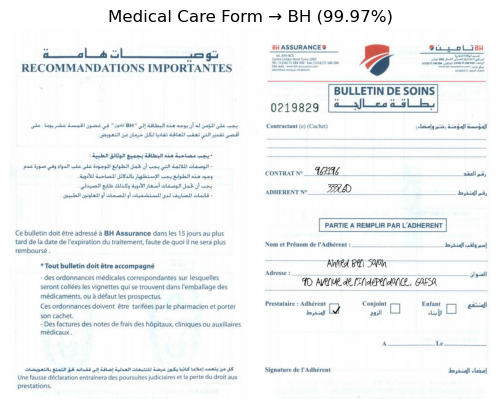

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step

Image: output_page_one_233.jpg
Step 1 - Binary Classification: Medical Care Form (1.54%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
Step 2 - Insurance Classification: BH (99.96%)


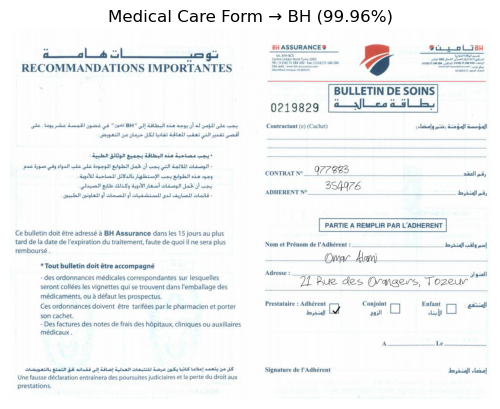

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step

Image: output_page_one_234.jpg
Step 1 - Binary Classification: Medical Care Form (0.22%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
Step 2 - Insurance Classification: BH (99.90%)


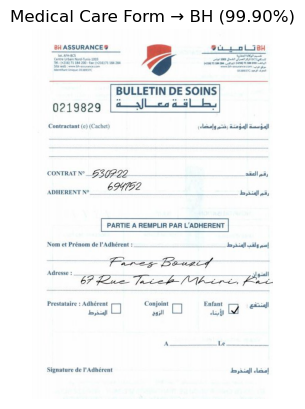

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

Image: output_page_one_235.jpg
Step 1 - Binary Classification: Medical Care Form (0.98%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
Step 2 - Insurance Classification: BH (99.95%)


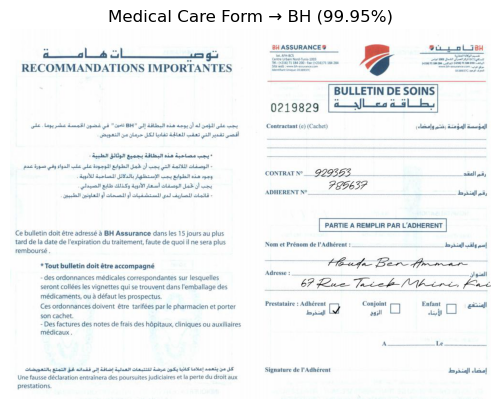

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

Image: output_page_one_236.jpg
Step 1 - Binary Classification: Medical Care Form (1.26%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
Step 2 - Insurance Classification: BH (99.97%)


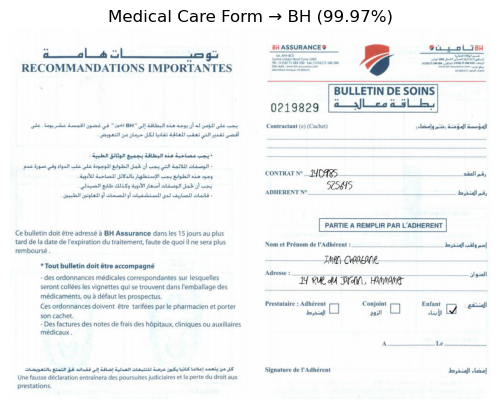

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step

Image: output_page_one_237.jpg
Step 1 - Binary Classification: Medical Care Form (0.36%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
Step 2 - Insurance Classification: BH (99.84%)


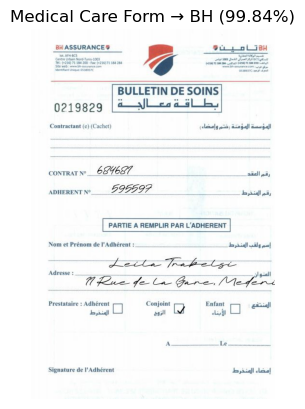

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Image: output_page_one_238.jpg
Step 1 - Binary Classification: Medical Care Form (1.10%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 325ms/step
Step 2 - Insurance Classification: BH (99.96%)


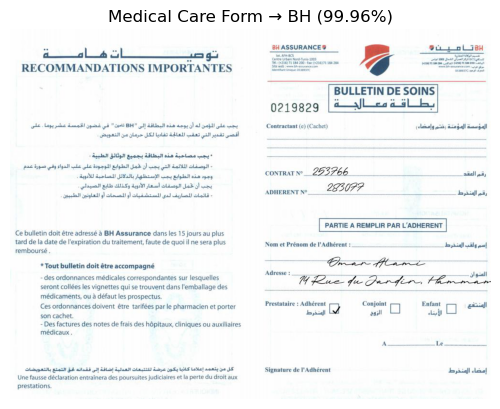

In [22]:
binary_model = load_model("CNN_model.h5")
multi_model = load_model("insurance_classifier_vgg16.h5")

test_folder = "folder"
classify_images(binary_model, multi_model, test_folder)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Image: 1668275707986.jpeg
Step 1 - Binary Classification: Prescription (99.83%)


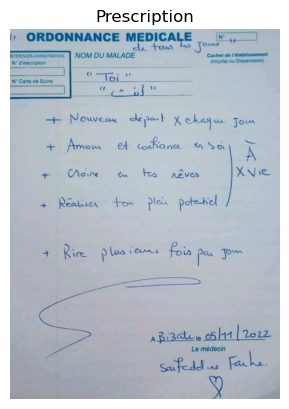

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: 1a9a8acc-a134-4e18-8a7e-303efd6490c9.png
Step 1 - Binary Classification: Medical Care Form (1.36%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
Step 2 - Insurance Classification: STAR (96.90%)


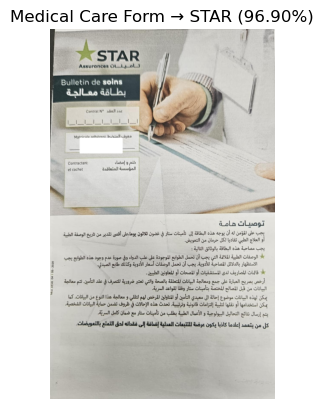

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

Image: 3c8e6c85-1191-4554-ba4c-013dfe24a1af (1).png
Step 1 - Binary Classification: Medical Care Form (37.56%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
Step 2 - Insurance Classification: STAR (99.15%)


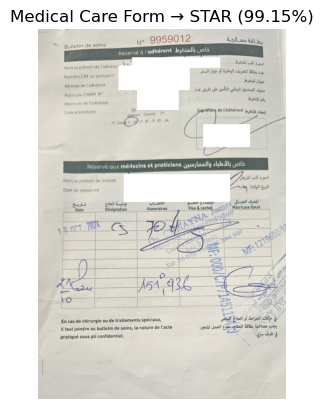

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

Image: 3d6ae565-23e7-4d42-b55a-a0970075063d.png
Step 1 - Binary Classification: Prescription (99.97%)


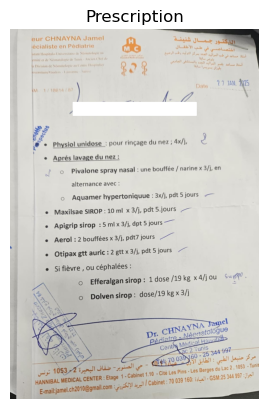

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

Image: 423568241_1085167485931888_2206447824091835237_n.png
Step 1 - Binary Classification: Prescription (77.54%)


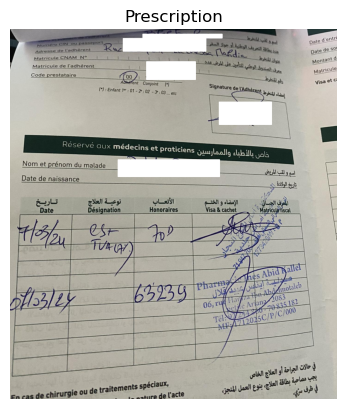

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

Image: 423619305_1461199547798124_5494216593614203976_n.png
Step 1 - Binary Classification: Prescription (97.74%)


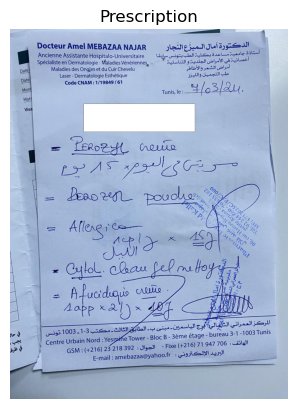

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

Image: 430890210_1360124484505691_7576348555829998378_n.png
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
Step 2 - Insurance Classification: STAR (99.99%)


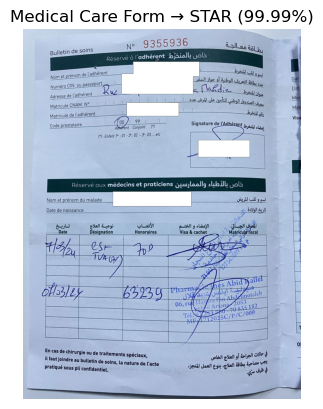

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

Image: 430911047_437977775243517_3123019589039676159_n.png
Step 1 - Binary Classification: Medical Care Form (1.25%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step
Step 2 - Insurance Classification: STAR (99.47%)


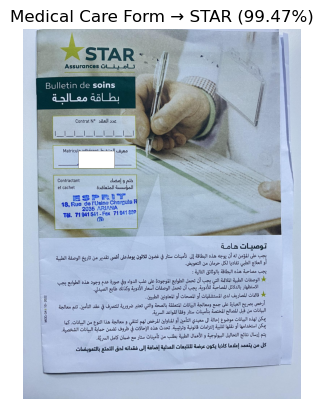

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

Image: 431053189_1458690305082326_5518977830508899765_n.png
Step 1 - Binary Classification: Prescription (91.69%)


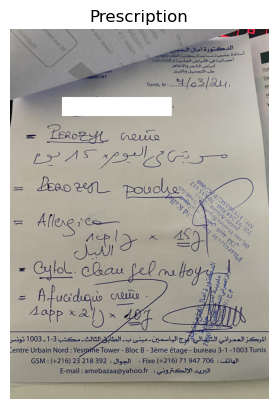

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

Image: 437284357_945985997021450_719262409630385928_n.jpg
Step 1 - Binary Classification: Medical Care Form (0.01%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
Step 2 - Insurance Classification: STAR (89.80%)


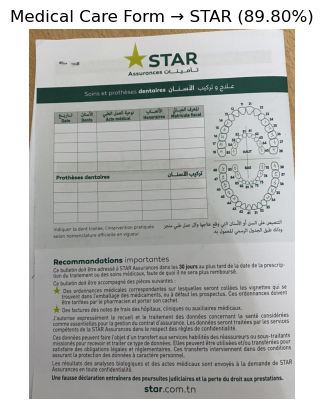

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

Image: 437309141_1578982486231687_1166633478136395242_n.png
Step 1 - Binary Classification: Prescription (99.92%)


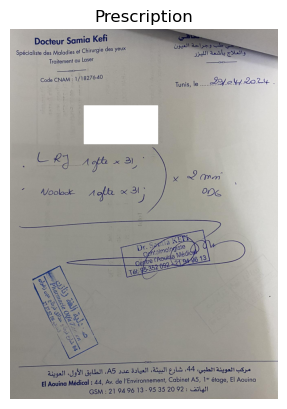

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

Image: 437570328_783826817027795_4517083124937635251_n.jpg
Step 1 - Binary Classification: Medical Care Form (12.45%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
Step 2 - Insurance Classification: STAR (99.83%)


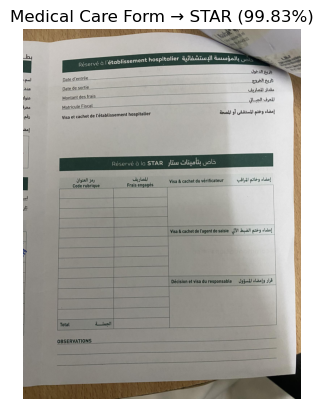

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

Image: 437684415_1444024722875900_5023633958174829810_n.png
Step 1 - Binary Classification: Prescription (99.60%)


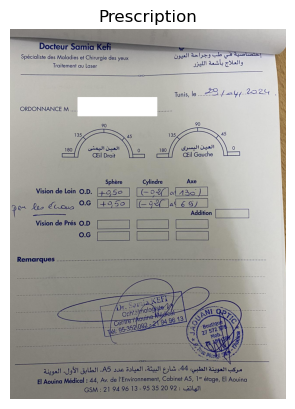

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

Image: 440828430_1484489785470850_257671477554688986_n.png
Step 1 - Binary Classification: Medical Care Form (34.46%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
Step 2 - Insurance Classification: STAR (95.65%)


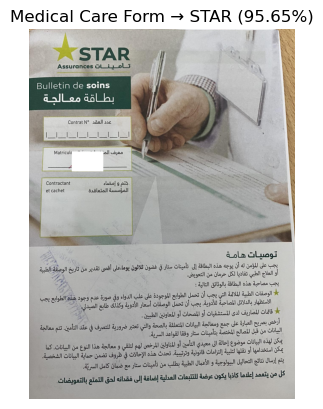

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

Image: 67eb8db5-bcea-48b0-809f-e9bc321c98b8.png
Step 1 - Binary Classification: Prescription (99.58%)


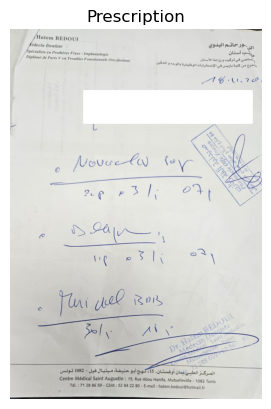

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Image: 6fb4b493-ed73-41b5-be0c-3bbca201cb9b (1).png
Step 1 - Binary Classification: Prescription (99.70%)


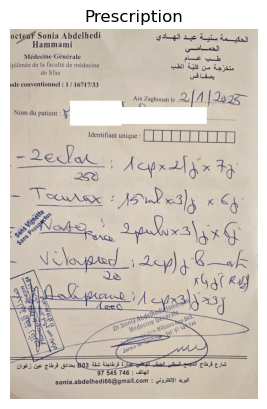

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

Image: 7249eb64-0674-4004-afe5-5bbbb9611404.png
Step 1 - Binary Classification: Medical Care Form (3.95%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
Step 2 - Insurance Classification: STAR (98.67%)


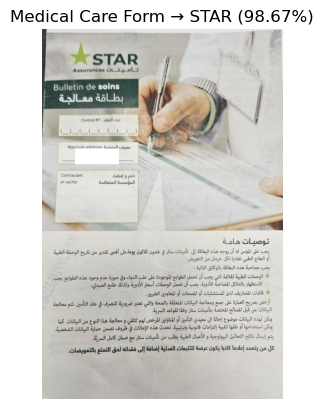

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step

Image: 7ba84d7c-d722-4350-a66b-98611fa8c03f.png
Step 1 - Binary Classification: Prescription (94.06%)


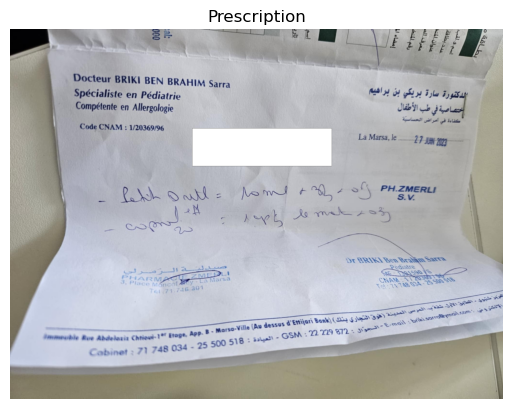

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step

Image: 84d9e4d1-8a37-49c8-853e-e93f9538deb5.png
Step 1 - Binary Classification: Prescription (100.00%)


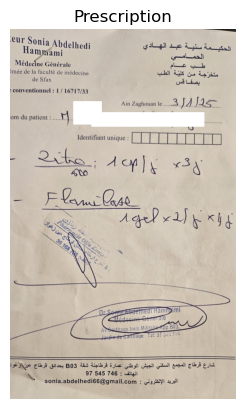

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step

Image: 936018f5-2453-4256-9575-7f0278615ed4 (1).png
Step 1 - Binary Classification: Prescription (99.82%)


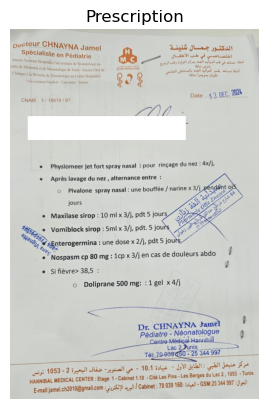

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step

Image: ayoub.jpeg
Step 1 - Binary Classification: Medical Care Form (31.15%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
Step 2 - Insurance Classification: STAR (93.43%)


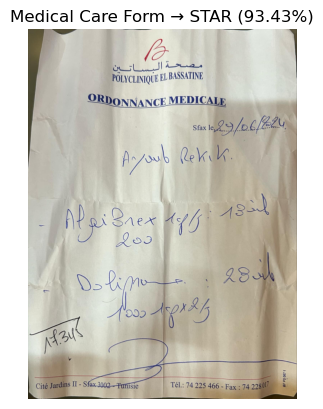

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

Image: BN22257ordonnance-medicale-winou-el-petrole.jpg
Step 1 - Binary Classification: Prescription (98.76%)


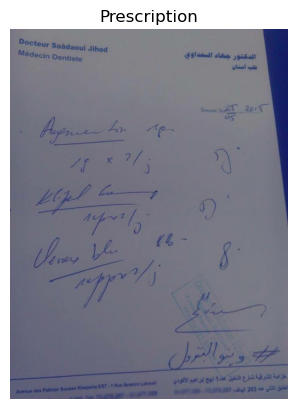

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

Image: c9f13968-1910-4b96-9e63-618c3aa37d95.png
Step 1 - Binary Classification: Prescription (98.90%)


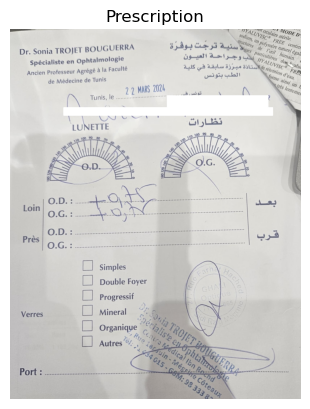

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step

Image: dbfb91a1-9975-48c3-8f86-bfa4e7fffb0b.png
Step 1 - Binary Classification: Medical Care Form (0.01%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
Step 2 - Insurance Classification: STAR (99.39%)


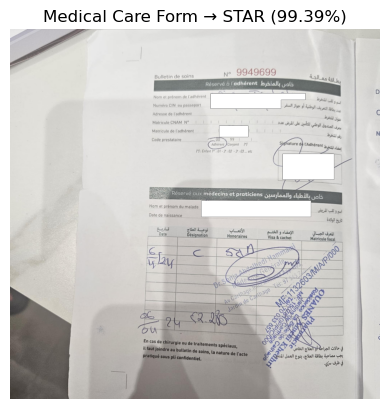

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step

Image: dc5c1f04-c233-4e68-b42b-2c3216fe7308.png
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step
Step 2 - Insurance Classification: STAR (99.76%)


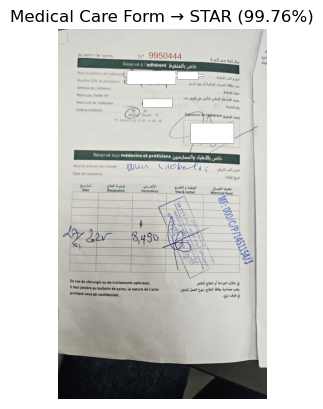

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step

Image: dfd6ef0f-f8d3-4b07-9775-ed8b9b76f2c3 (1).png
Step 1 - Binary Classification: Medical Care Form (0.00%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
Step 2 - Insurance Classification: STAR (99.69%)


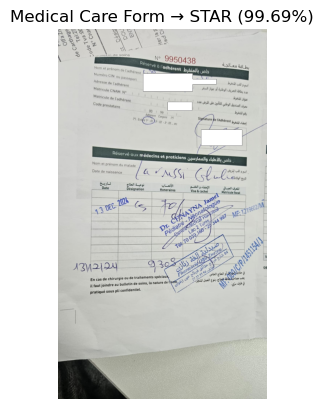

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step

Image: e02afbab-3150-42e4-92a6-43b5a960cdb5 (1).png
Step 1 - Binary Classification: Prescription (96.60%)


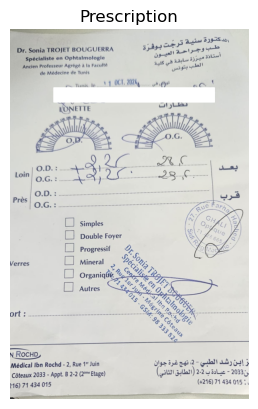

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step

Image: e3034721-4b07-44e4-a167-2802acb2c93d.png
Step 1 - Binary Classification: Medical Care Form (0.37%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
Step 2 - Insurance Classification: STAR (99.64%)


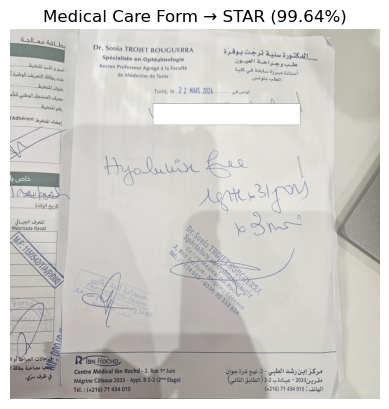

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

Image: e6a0230e-1eed-4ca2-8b23-3cd03f48b5c9.png
Step 1 - Binary Classification: Prescription (66.57%)


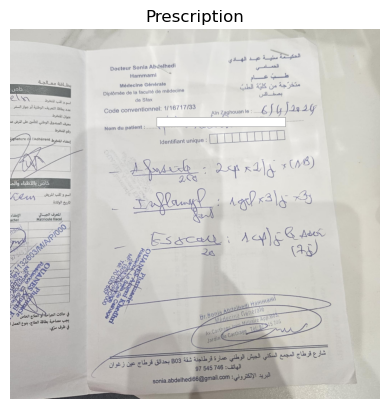

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step

Image: ee6e0ce4-c52e-46b8-b381-ad479ecd681b.jpeg
Step 1 - Binary Classification: Medical Care Form (1.26%)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
Step 2 - Insurance Classification: STAR (99.93%)


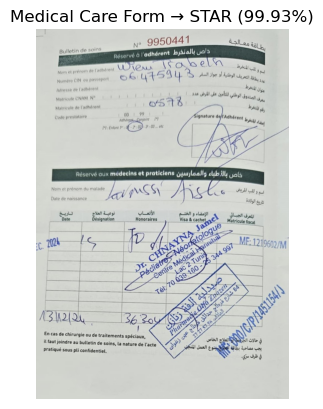

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

Image: images.jpeg
Step 1 - Binary Classification: Prescription (99.66%)


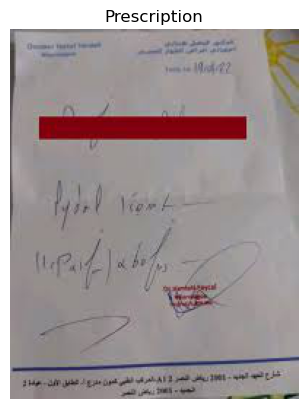

In [23]:
test_folder_path = "test_images"
classify_images(binary_model, multi_model, test_folder_path)